/home/yangchen/.conda/envs/diffusers30/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


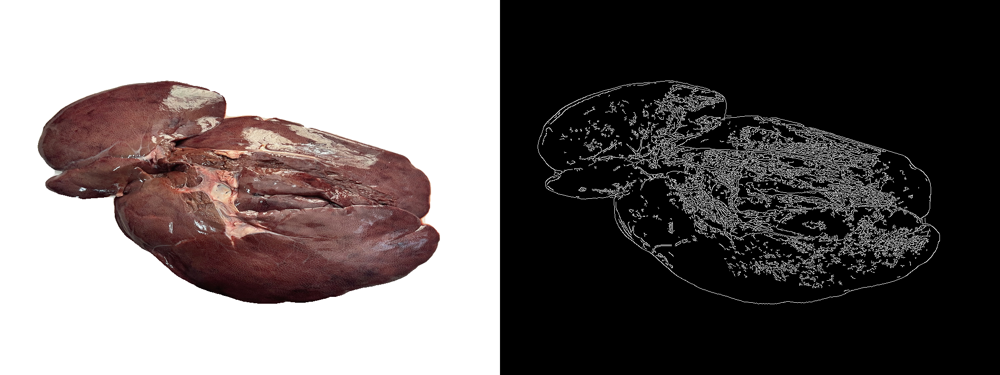

In [1]:
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image, make_image_grid
from PIL import Image
import cv2
import numpy as np
import torch

original_image = load_image(
    '/data_hdd3/users/yangchen/Ruijing_medical_projects/new_data/masked_images/1-masked_images_0000.png'
)

image = np.array(original_image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
make_image_grid([original_image, canny_image], rows=1, cols=2)

/home/yangchen/.conda/envs/diffusers30/lib/python3.9/site-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(


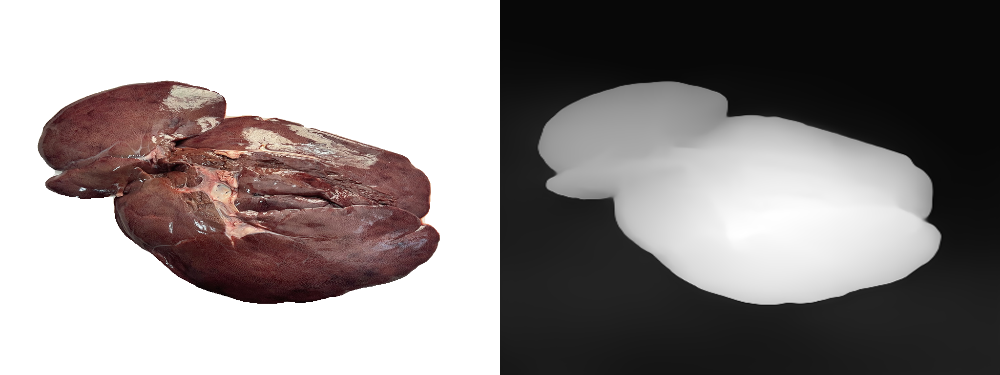

In [2]:
from transformers import DPTFeatureExtractor, DPTForDepthEstimation

depth_estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")
feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-hybrid-midas")

def get_depth_map(image):
    image = feature_extractor(images=image, return_tensors="pt").pixel_values.to("cuda")
    with torch.no_grad(), torch.autocast("cuda"):
        depth_map = depth_estimator(image).predicted_depth

    depth_map = torch.nn.functional.interpolate(
        depth_map.unsqueeze(1),
        size=(original_image.height, original_image.width),
        mode="bicubic",
        align_corners=False,
    )
    depth_min = torch.amin(depth_map, dim=[1, 2, 3], keepdim=True)
    depth_max = torch.amax(depth_map, dim=[1, 2, 3], keepdim=True)
    depth_map = (depth_map - depth_min) / (depth_max - depth_min)
    image = torch.cat([depth_map] * 3, dim=1)

    image = image.permute(0, 2, 3, 1).cpu().numpy()[0]
    image = Image.fromarray((image * 255.0).clip(0, 255).astype(np.uint8))
    return image

image = np.array(original_image)
depth_image = get_depth_map(original_image)
make_image_grid([original_image, depth_image], rows=1, cols=2)

In [ ]:
controlnet_depth = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True
)
controlnet_canny = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True
)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16, use_safetensors=True)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet_depth,
    vae=vae,
    torch_dtype=torch.float16,
    use_safetensors=True
)
cached_folder = "./weights"
pipe.load_lora_weights(cached_folder)
pipe.enable_model_cpu_offload()

Loading pipeline components...: 100%|██████████| 7/7 [02:26<00:00, 20.94s/it] 


100%|██████████| 50/50 [00:18<00:00,  2.73it/s]


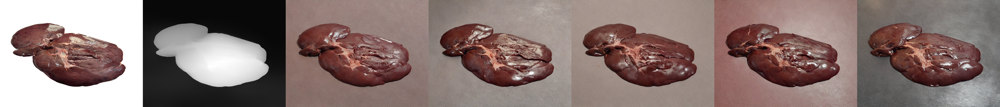

In [4]:
pipe.controlnet = controlnet_depth.cuda()
prompt = "a healthy pig liver"
# negative_prompt = 'low quality, bad quality, sketches'
lora_scale = 0.9

images = []
for _ in range(5):
    image = pipe(
        prompt,
        # negative_prompt=negative_prompt,
        image=depth_image,
        controlnet_conditioning_scale=0.9,
        cross_attention_kwargs={"scale": lora_scale},
    ).images[0]
    images.append(image)

make_image_grid([original_image, depth_image] + images, rows=1, cols=7)

100%|██████████| 50/50 [00:18<00:00,  2.72it/s]


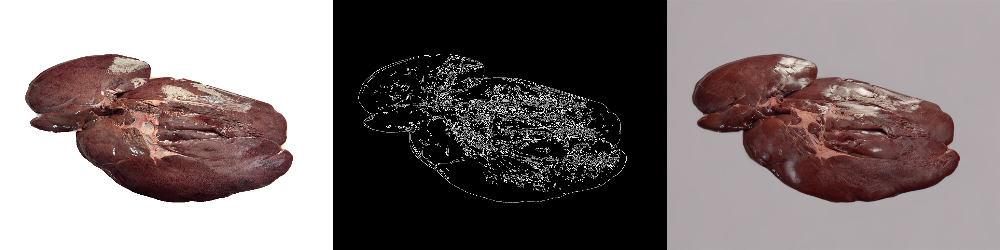

In [5]:
pipe.controlnet = controlnet_canny.cuda()
prompt = "a healthy pig liver"
# negative_prompt = 'low quality, bad quality, sketches'
lora_scale = 0.9

image = pipe(
    prompt,
    # negative_prompt=negative_prompt,
    image=canny_image,
    controlnet_conditioning_scale=0.9,
    cross_attention_kwargs={"scale": lora_scale},
).images[0]
make_image_grid([original_image, canny_image, image], rows=1, cols=3)
